In [ ]:
!pip install retinaface_pytorch

     |████████████████████████████████| 98 kB 7.3 MB/s 
     |████████████████████████████████| 22.1 MB 1.3 MB/s 
     |████████████████████████████████| 831.4 MB 2.0 kB/s 
     |████████████████████████████████| 47.8 MB 1.4 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!rsync -avz "/content/drive/MyDrive/data/"  "/data"

Streaming output truncated to the last 5000 lines.
Train/WithoutMask/1665.png
Train/WithoutMask/1666.png
Train/WithoutMask/1667.png
Train/WithoutMask/1668.png
Train/WithoutMask/1669.png
Train/WithoutMask/167.png
Train/WithoutMask/1670.png
Train/WithoutMask/1671.png
Train/WithoutMask/1672.png
Train/WithoutMask/1673.png
Train/WithoutMask/1674.png
Train/WithoutMask/1675.png
Train/WithoutMask/1676.png
Train/WithoutMask/1677.png
Train/WithoutMask/1678.png
Train/WithoutMask/1679.png
Train/WithoutMask/168.png
Train/WithoutMask/1680.png
Train/WithoutMask/1681.png
Train/WithoutMask/1682.png
Train/WithoutMask/1683.png
Train/WithoutMask/1684.png
Train/WithoutMask/1685.png
Train/WithoutMask/1686.png
Train/WithoutMask/1687.png
Train/WithoutMask/1688.png
Train/WithoutMask/1689.png
Train/WithoutMask/1690.png
Train/WithoutMask/1691.png
Train/WithoutMask/1692.png
Train/WithoutMask/1693.png
Train/WithoutMask/1694.png
Train/WithoutMask/1695.png
Train/WithoutMask/1697.png
Train/WithoutMask/1698.png
Train/

In [ ]:
from keras.applications.vgg19 import VGG19
from keras.applications.vgg19 import preprocess_input
from keras import Sequential
from keras.layers import Flatten, Dense
from keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import glob

In [ ]:
from retinaface.pre_trained_models import get_model as get_detector

/usr/local/lib/python3.7/dist-packages/torch/hub.py:513: UserWarning: Falling back to the old format < 1.6. This support will be deprecated in favor of default zipfile format introduced in 1.6. Please redo torch.save() to save it in the new zipfile format.
  warnings.warn('Falling back to the old format < 1.6. This support will be '


/content/drive/MyDrive/data/images/maksssksksss809.png
/content/drive/MyDrive/data/images/maksssksksss543.png
/content/drive/MyDrive/data/images/maksssksksss331.png
/content/drive/MyDrive/data/images/maksssksksss591.png
/content/drive/MyDrive/data/images/maksssksksss122.png
/content/drive/MyDrive/data/images/maksssksksss553.png
/content/drive/MyDrive/data/images/maksssksksss235.png
/content/drive/MyDrive/data/images/maksssksksss368.png
/content/drive/MyDrive/data/images/maksssksksss131.png
/content/drive/MyDrive/data/images/maksssksksss514.png


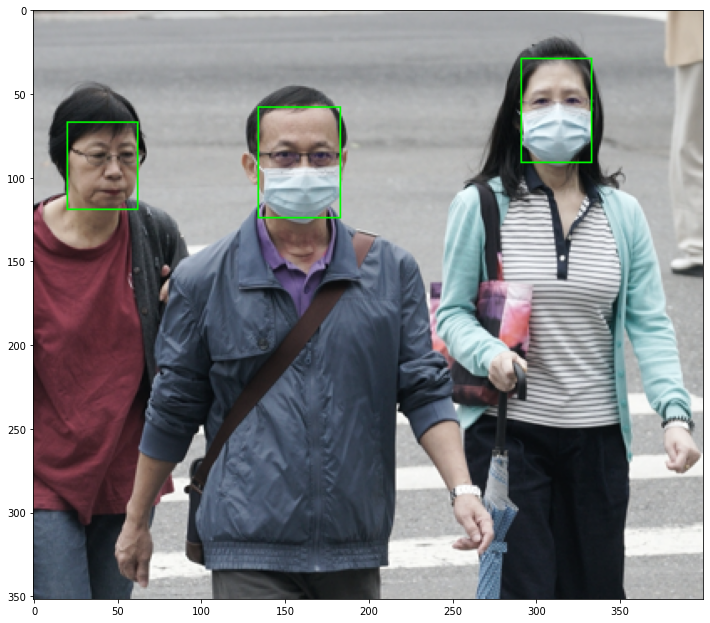

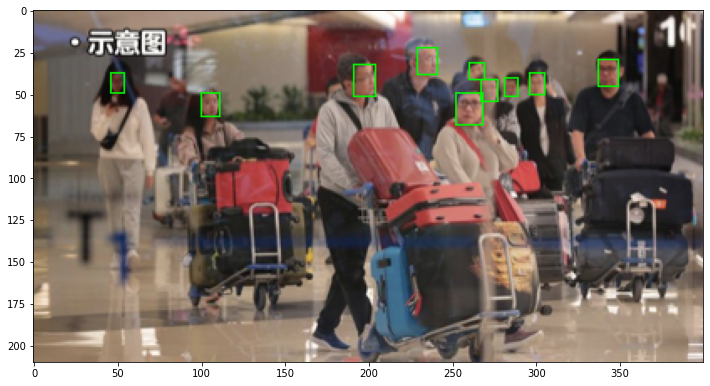

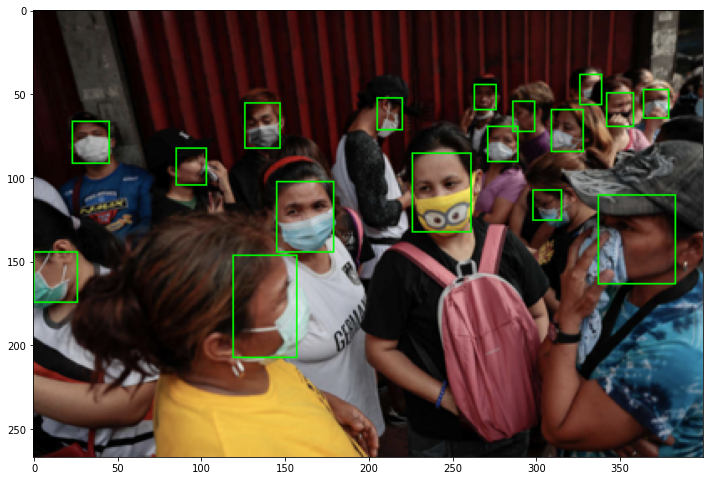

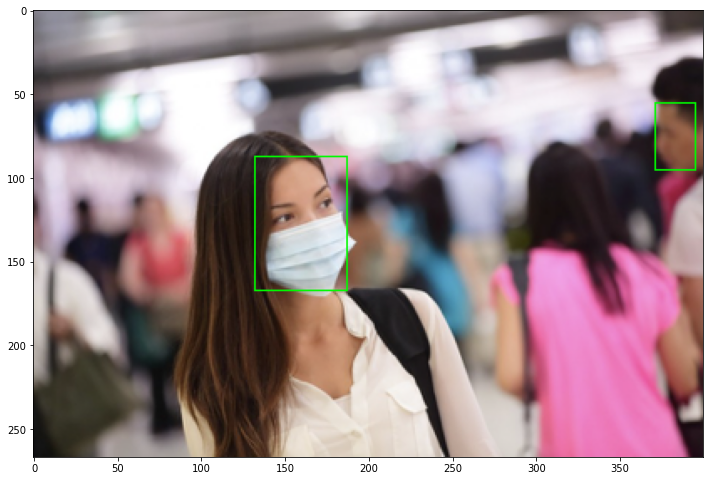

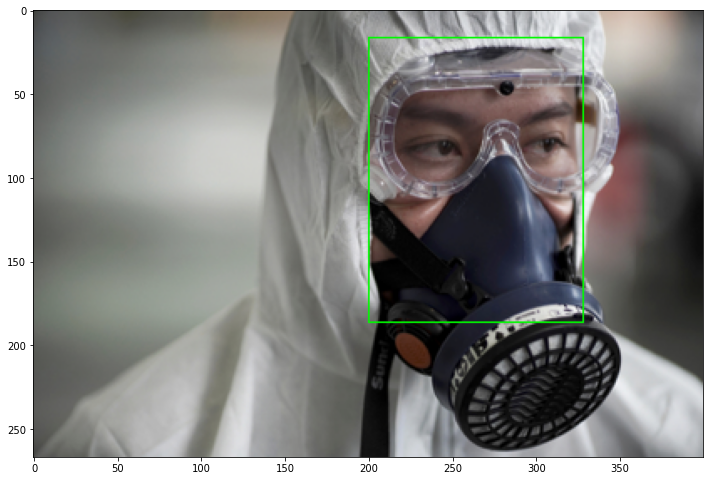

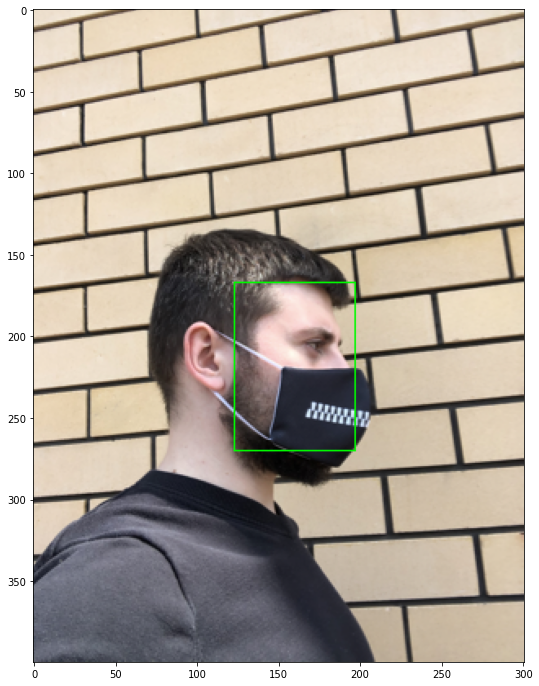

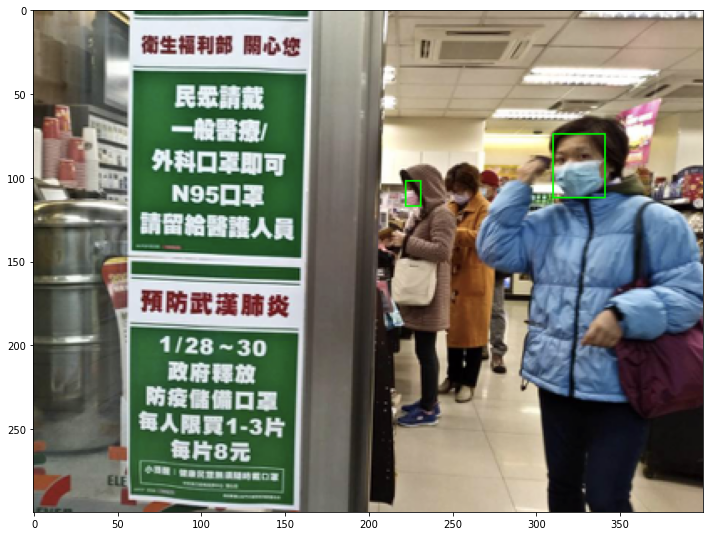

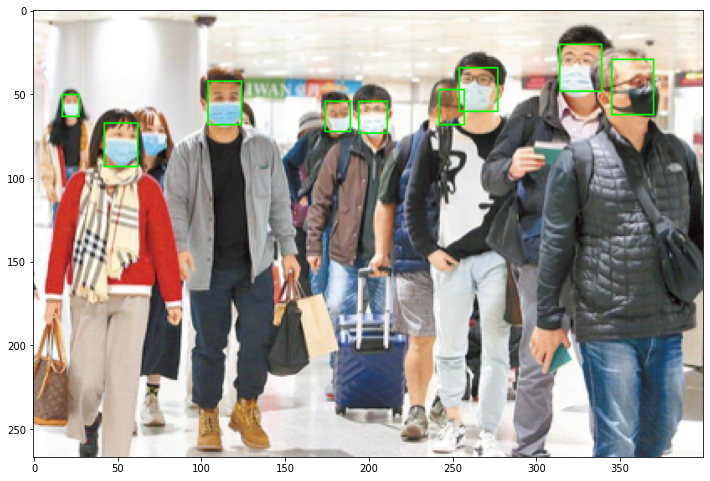

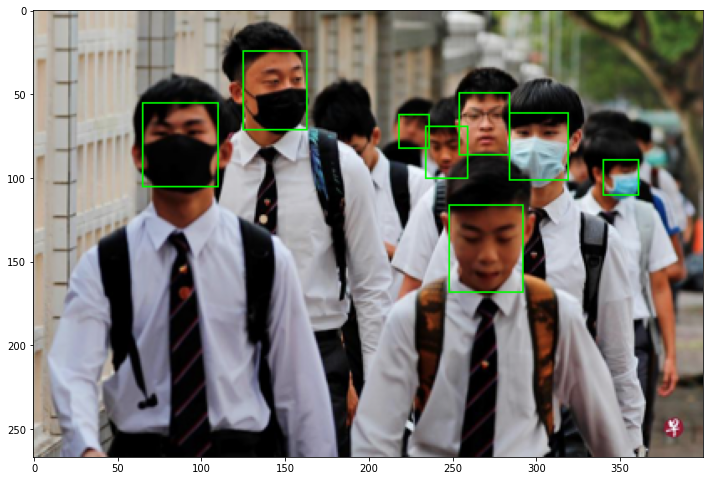

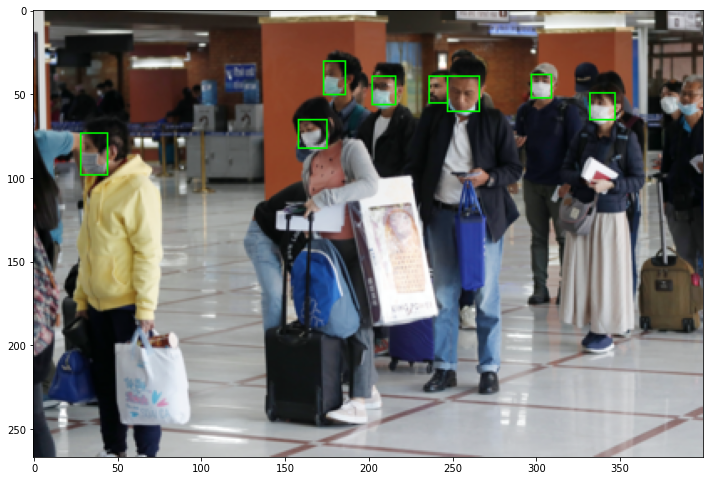

In [ ]:

some_img = glob.glob("/content/drive/MyDrive/data/images/*.png")

face_detector = get_detector("resnet50_2020-07-20", max_size=800)
face_detector.eval()

for p in random.choices(some_img, k=10):
    print(p)
    img = cv2.imread(p)

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    faces = face_detector.predict_jsons(img)

    #plotting
    for annotation in faces:
        x_min, y_min, x_max, y_max = annotation["bbox"]
        x_min = np.clip(x_min, 0, x_max - 1)
        y_min = np.clip(y_min, 0, y_max - 1)
        vis_image = cv2.rectangle(img, (int(x_min), int(y_min)), (int(x_max), int(y_max)), (0,250,0), 1)
    plt.figure(figsize=(12,12))
    plt.imshow(vis_image)

In [ ]:
train_dir = '/data/Train'
test_dir = '/data/Test'
val_dir = '/data/Validation'

In [ ]:
train_datagen = ImageDataGenerator(rescale=1.0/255, horizontal_flip=True, zoom_range=0.2,shear_range=0.2)
train_generator = train_datagen.flow_from_directory(directory=train_dir,target_size=(128,128),class_mode='categorical',batch_size=32)

val_datagen = ImageDataGenerator(rescale=1.0/255)
val_generator = train_datagen.flow_from_directory(directory=val_dir,target_size=(128,128),class_mode='categorical',batch_size=32)

test_datagen = ImageDataGenerator(rescale=1.0/255)
test_generator = train_datagen.flow_from_directory(directory=test_dir,target_size=(128,128),class_mode='categorical',batch_size=32)

Found 10010 images belonging to 2 classes.
Found 800 images belonging to 2 classes.
Found 992 images belonging to 2 classes.


In [ ]:
vgg19 = VGG19(weights='imagenet',include_top=False,input_shape=(128,128,3))

for layer in vgg19.layers:
    layer.trainable = False
    
model = Sequential()
model.add(vgg19)
model.add(Flatten())
model.add(Dense(2,activation='sigmoid'))
model.summary()

80150528/80134624 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 4, 4, 512)         20024384  
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense (Dense)               (None, 2)                 16386     
                                                                 
Total params: 20,040,770
Trainable params: 16,386
Non-trainable params: 20,024,384
_________________________________________________________________


In [ ]:
model.compile(optimizer="adam",loss="categorical_crossentropy",metrics ="accuracy")

In [ ]:
history = model.fit_generator(generator=train_generator,
                              steps_per_epoch=len(train_generator)//32,
                              epochs=20,validation_data=val_generator,
                              validation_steps=len(val_generator)//32)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  after removing the cwd from sys.path.


Epoch 1/20
9/9 [==============================] - 60s 7s/step - loss: 0.5372 - accuracy: 0.7292
Epoch 2/20
9/9 [==============================] - 59s 7s/step - loss: 0.2711 - accuracy: 0.9062
Epoch 3/20
9/9 [==============================] - 59s 7s/step - loss: 0.1740 - accuracy: 0.9444
Epoch 4/20
9/9 [==============================] - 59s 7s/step - loss: 0.1188 - accuracy: 0.9583
Epoch 5/20
9/9 [==============================] - 59s 7s/step - loss: 0.1295 - accuracy: 0.9618
Epoch 6/20
9/9 [==============================] - 59s 7s/step - loss: 0.1050 - accuracy: 0.9583
Epoch 7/20
9/9 [==============================] - 58s 6s/step - loss: 0.1175 - accuracy: 0.9504
Epoch 8/20
9/9 [==============================] - 59s 7s/step - loss: 0.0666 - accuracy: 0.9826
Epoch 9/20
9/9 [==============================] - 59s 7s/step - loss: 0.0890 - accuracy: 0.9688
Epoch 10/20
9/9 [==============================] - 59s 7s/step - loss: 0.0670 - accuracy: 0.9896
Epoch 11/20
9/9 [======================

In [ ]:
model.evaluate_generator(test_generator)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  """Entry point for launching an IPython kernel.


[0.0487370602786541, 0.9879032373428345]

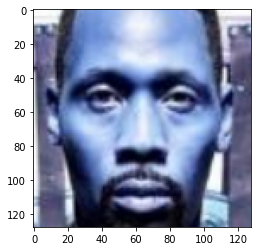

In [ ]:
sample_mask_img = cv2.imread('/data/Test/WithoutMask/1.png')
sample_mask_img = cv2.resize(sample_mask_img,(128,128))
plt.imshow(sample_mask_img)
sample_mask_img = np.reshape(sample_mask_img,[1,128,128,3])
sample_mask_img = sample_mask_img/255.0

In [ ]:
model.predict(sample_mask_img)

array([[0.02759442, 0.95128906]], dtype=float32)

In [ ]:
model.save('/data/my_model.h5')

In [ ]:
import keras
reconstructed_model = keras.models.load_model("/content/drive/MyDrive/data/my_model.h5")

In [ ]:
mask_label = {
    0:'MASK',
    1:'NO MASK'
             }
rect_label = {
    0:(0,250,0),
    1:(250,0,0)
             }

In [ ]:
face_model = cv2.CascadeClassifier('/content/drive/MyDrive/data/haar/haarcascade_frontalface_alt.xml')

In [ ]:
some_img = glob.glob("/content/drive/MyDrive/data/images/*.png")

face_detector = get_detector("resnet50_2020-07-20", max_size=800)
face_detector.eval()

def show_results(p):
    img = cv2.imread(p)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    faces = face_detector.predict_jsons(img)

    counter_masks = {
        'has_mask': 0,
        'no_mask': 0
    }
    for annotation in faces:
        x_min, y_min, x_max, y_max = annotation["bbox"]

        x_min = int(np.clip(x_min, 0, x_max))
        y_min = int(np.clip(y_min, 0, y_max))

        crop = img[int(y_min):int(y_max), int(x_min):int(x_max)]
        crop = cv2.resize(crop,(128,128))
        crop = np.reshape(crop,[1,128,128,3])/255.0

        mask_result = reconstructed_model.predict(crop)
        has_mask = mask_result.argmax()

        if has_mask==0:
            counter_masks['has_mask'] += 1
        else:
            counter_masks['no_mask'] += 1

        cv2.putText(img,mask_label[has_mask],(x_min, y_min-10),cv2.FONT_HERSHEY_SIMPLEX,0.5,rect_label[has_mask],2)
        cv2.rectangle(img,(int(x_min),int(y_min)),(int(x_max), int(y_max)),rect_label[has_mask],1)

    plt.figure(figsize=(10,10))
    annot1 = f"People with MASKS: {counter_masks['has_mask']};"
    annot2 = f"People with NO MASKS: {counter_masks['no_mask']}."
    cv2.putText(img,text=annot1,org=(10, 10),fontFace=cv2.FONT_HERSHEY_TRIPLEX,fontScale=0.5,color=(255, 255, 255),thickness=1)
    cv2.putText(img,text=annot2,org=(10, 30),fontFace=cv2.FONT_HERSHEY_TRIPLEX,fontScale=0.5,color=(255, 255, 255),thickness=1)
    plt.imshow(img)

/usr/local/lib/python3.7/dist-packages/torch/hub.py:513: UserWarning: Falling back to the old format < 1.6. This support will be deprecated in favor of default zipfile format introduced in 1.6. Please redo torch.save() to save it in the new zipfile format.
  warnings.warn('Falling back to the old format < 1.6. This support will be '


/content/drive/MyDrive/data/images/maksssksksss671.png
/content/drive/MyDrive/data/images/maksssksksss477.png
/content/drive/MyDrive/data/images/maksssksksss303.png
/content/drive/MyDrive/data/images/maksssksksss613.png
/content/drive/MyDrive/data/images/maksssksksss368.png
/content/drive/MyDrive/data/images/maksssksksss127.png
/content/drive/MyDrive/data/images/maksssksksss453.png
/content/drive/MyDrive/data/images/maksssksksss377.png
/content/drive/MyDrive/data/images/maksssksksss822.png
/content/drive/MyDrive/data/images/maksssksksss639.png


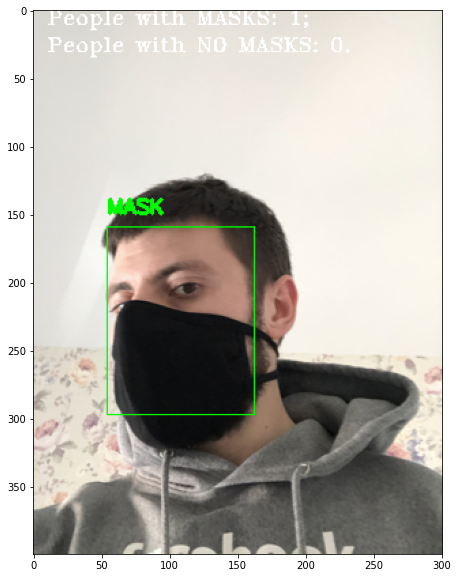

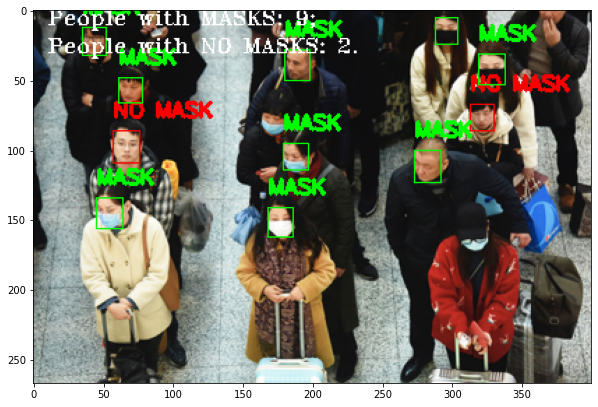

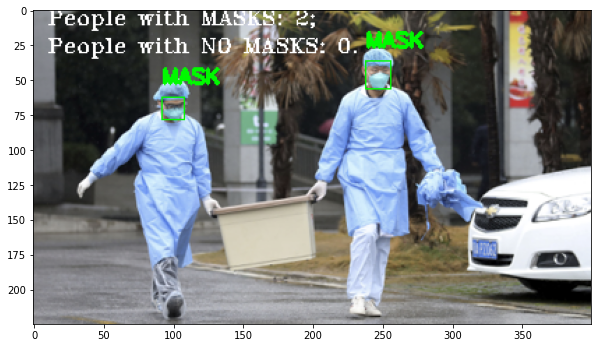

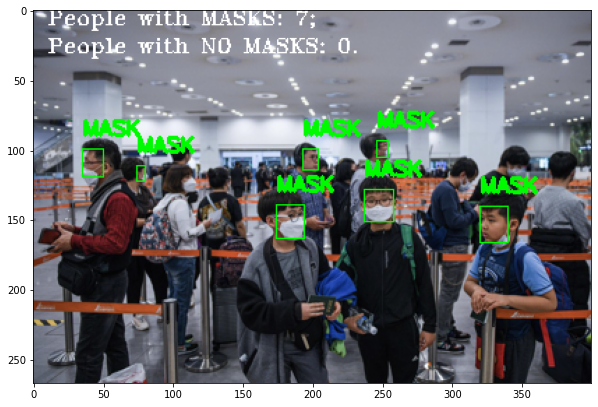

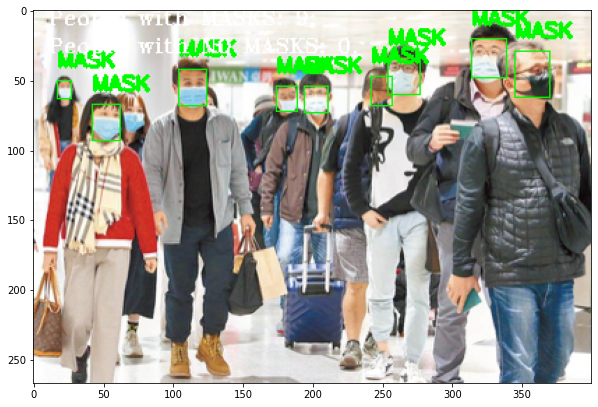

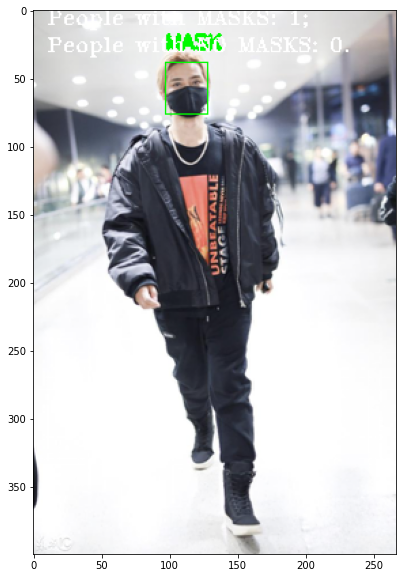

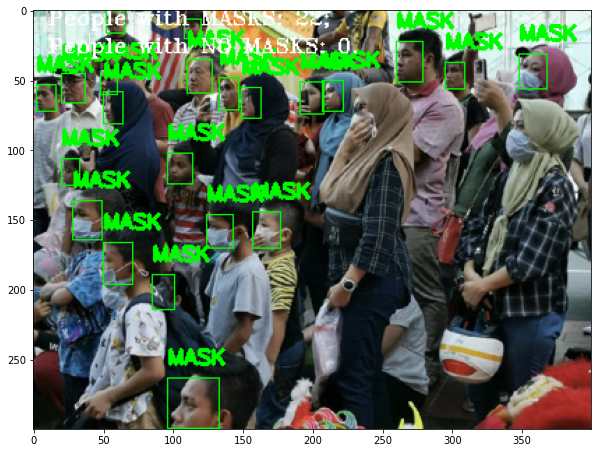

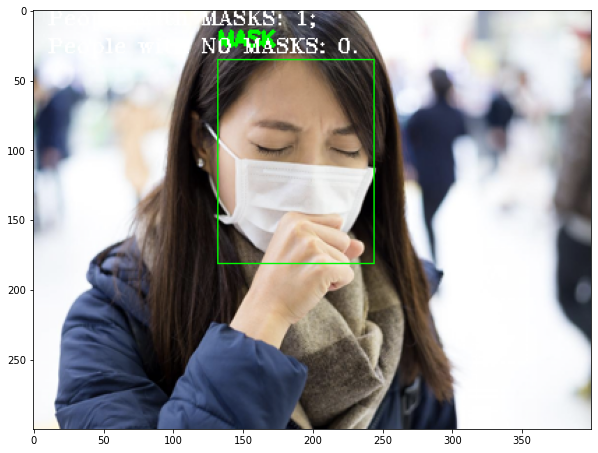

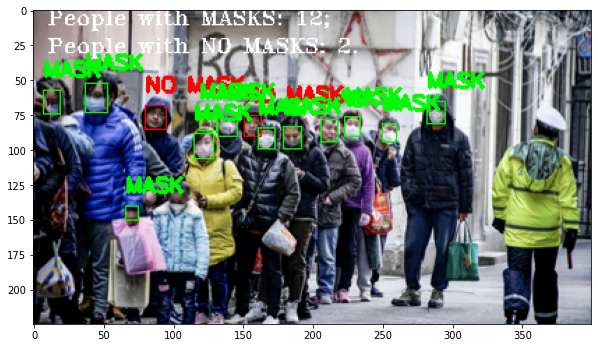

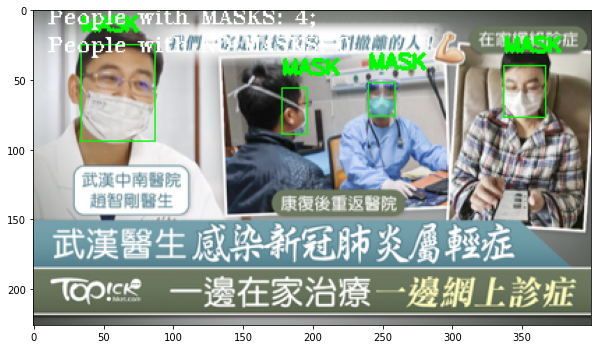

In [ ]:
some_img = glob.glob("/content/drive/MyDrive/data/images/*.png")

for p in random.choices(some_img, k=10):
    print(p)
    show_results(p)